In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
import pandas as pd

df = pd.read_csv("Sales.csv")
print(df.head())

  TransactionNo        Date ProductNo                          ProductName  \
0        581482  12-09-2019     22485        Set Of 2 Wooden Market Crates   
1        581475  12-09-2019     22596  Christmas Star Wish List Chalkboard   
2        581475  12-09-2019     23235             Storage Tin Vintage Leaf   
3        581475  12-09-2019     23272    Tree T-Light Holder Willie Winkie   
4        581475  12-09-2019     23239    Set Of 4 Knick Knack Tins Poppies   

   Price  Quantity  CustomerNo         Country  
0  21.47      12.0     17490.0  United Kingdom  
1  10.65      36.0     13069.0  United Kingdom  
2  11.53      12.0     13069.0  United Kingdom  
3  10.65      12.0     13069.0  United Kingdom  
4  11.94       6.0     13069.0  United Kingdom  


<ipython-input-1-048384fae0d8>:3: DtypeWarning: Columns (0,1,2,3,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Sales.csv")


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Data Preparation
df.dropna(inplace=True)
df['Sales'] = df['Price'] * df['Quantity']

# Filter out negative sales
df = df[df['Sales'] >= 0]

# Convert Date column with mixed formats
df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True, errors='coerce')

# Drop any rows where the date couldn't be parsed
df.dropna(subset=['Date'], inplace=True)

# Creating Basic Plots

<ipython-input-21-df989f16d3e9>:14: UserWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



In [26]:
import plotly.express as px

country_sales = df.groupby('Country')['Sales'].sum().reset_index()
fig = px.choropleth(country_sales,
                    locations="Country",
                    locationmode='country names',
                    color="Sales",
                    hover_name="Country",
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.update_layout(title="Geographical Distribution of Sales")
fig.show()


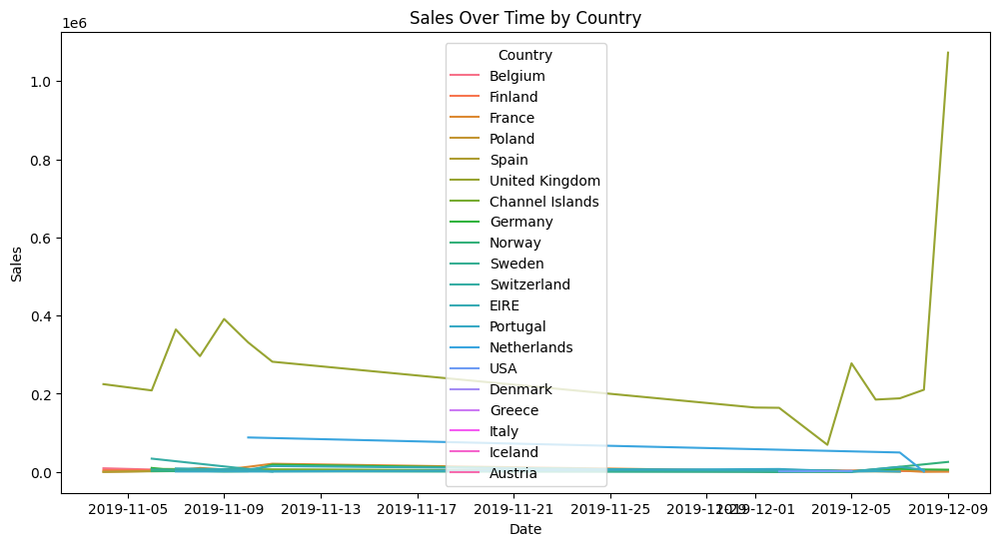

In [ ]:
sales_over_time = df.groupby(['Date', 'Country'])['Sales'].sum().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=sales_over_time, x='Date', y='Sales', hue='Country')
plt.title('Sales Over Time by Country')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend(title='Country')
plt.show()


<ipython-input-14-11be1bb7204c>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-14-11be1bb7204c>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




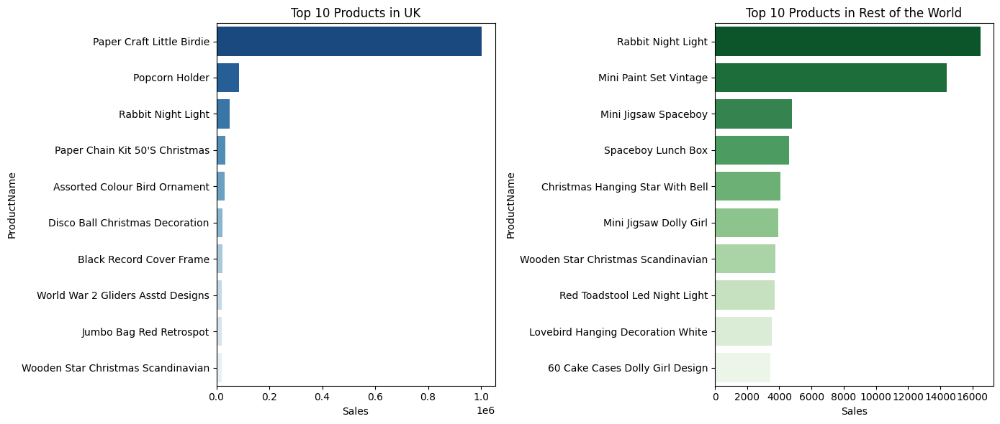

In [ ]:
top_products_uk = df[df['Country'] == 'United Kingdom'].groupby('ProductName')['Sales'].sum().nlargest(10).reset_index()
top_products_world = df[df['Country'] != 'United Kingdom'].groupby('ProductName')['Sales'].sum().nlargest(10).reset_index()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.barplot(x='Sales', y='ProductName', data=top_products_uk, palette='Blues_r')
plt.title('Top 10 Products in UK')

plt.subplot(1, 2, 2)
sns.barplot(x='Sales', y='ProductName', data=top_products_world, palette='Greens_r')
plt.title('Top 10 Products in Rest of the World')

plt.tight_layout()
plt.show()


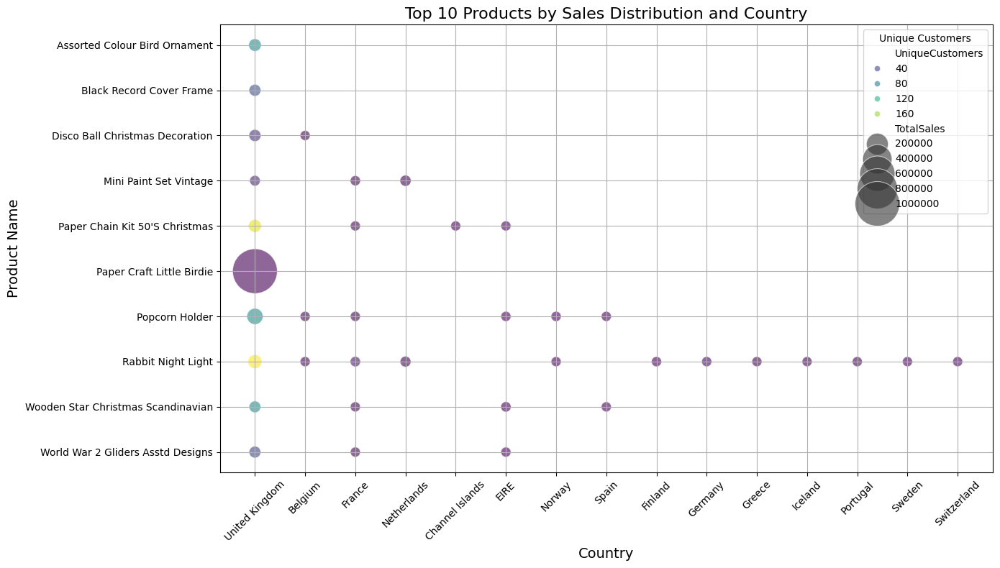

In [ ]:

df['TotalSales'] = df['Price'] * df['Quantity']  # Calculate total sales per transaction

# Grouping the data
df_grouped = df.groupby(['ProductName', 'Country']).agg(
    TotalSales=('TotalSales', 'sum'),
    UniqueCustomers=('CustomerNo', 'nunique')
).reset_index()

# Get the top 10 products by total sales
top_products = df_grouped.groupby('ProductName')['TotalSales'].sum().nlargest(10).index
df_top = df_grouped[df_grouped['ProductName'].isin(top_products)]

# Plotting the Bubble Plot for top 10 products
plt.figure(figsize=(14, 8))
bubble_plot = sns.scatterplot(
    data=df_top, x='Country', y='ProductName',
    size='TotalSales', hue='UniqueCustomers',
    sizes=(100, 2000), alpha=0.6, edgecolor="w", palette="viridis"
)

# Customizing the plot
plt.title('Top 10 Products by Sales Distribution and Country', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Product Name', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Unique Customers', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()

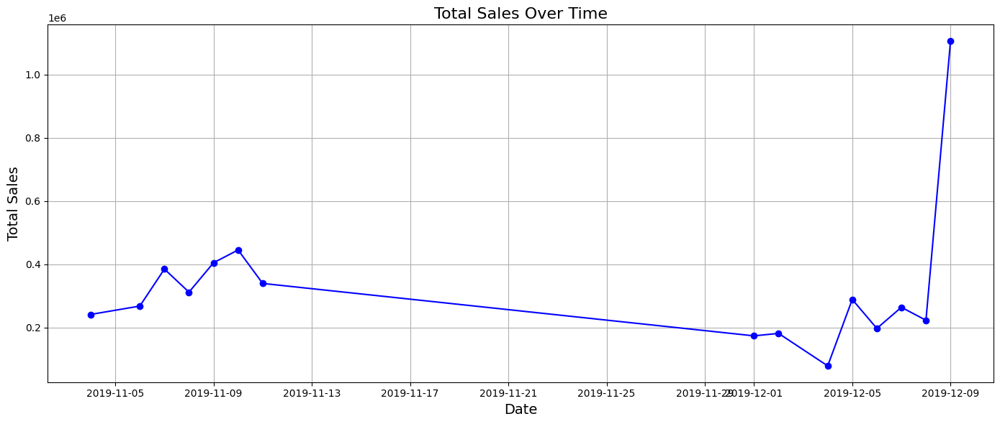

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])
df['TotalSales'] = df['Price'] * df['Quantity']  # Calculate total sales per transaction

# Aggregate sales by date
df_time_series = df.groupby('Date').agg(TotalSales=('TotalSales', 'sum')).reset_index()

# Plotting the time series
plt.figure(figsize=(14, 6))
plt.plot(df_time_series['Date'], df_time_series['TotalSales'], marker='o', linestyle='-', color='b')
plt.title('Total Sales Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


<ipython-input-20-911da0313d58>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




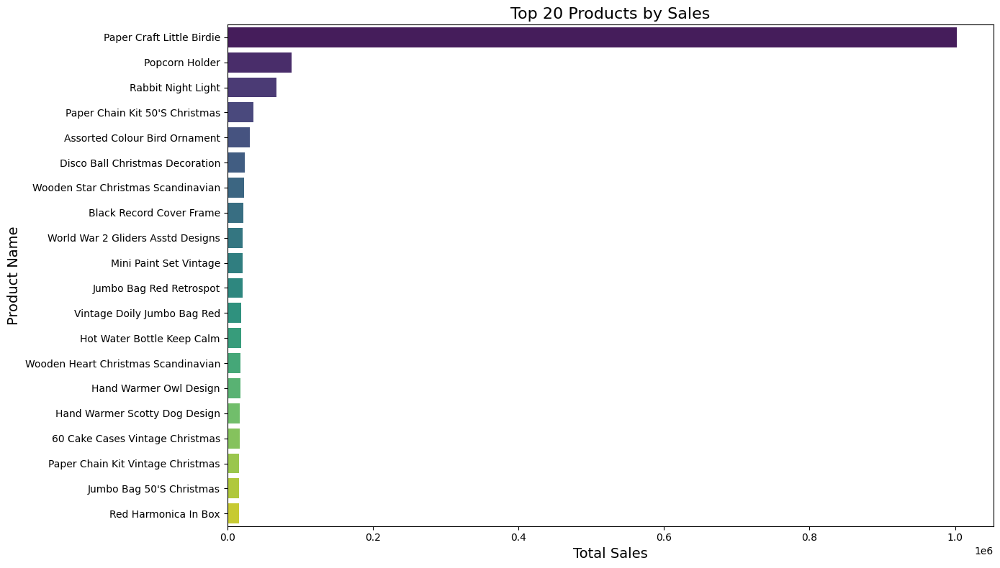

In [ ]:

# Data preprocessing
df['Sales'] = df['Price'] * df['Quantity']  # Calculate total sales per transaction

# Grouping and getting top 20 products by sales
product_sales = df.groupby('ProductName')['Sales'].sum().nlargest(20).reset_index()

# Plotting the bar chart for top 20 products
plt.figure(figsize=(14, 8))
sns.barplot(x='Sales', y='ProductName', data=product_sales, palette='viridis')
plt.title('Top 20 Products by Sales', fontsize=16)
plt.xlabel('Total Sales', fontsize=14)
plt.ylabel('Product Name', fontsize=14)
plt.tight_layout()

# Show plot
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df['TotalSales'] = df['Price'] * df['Quantity']  # Calculate total sales per transaction

# Aggregate sales by country and product
df_country_product_sales = df.groupby(['Country', 'ProductName']).agg(TotalSales=('TotalSales', 'sum')).unstack().fillna(0)

# Get the top 5 countries by total sales
top_countries = df.groupby('Country')['TotalSales'].sum().nlargest(5).index
df_top_country_product_sales = df_country_product_sales.loc[top_countries]

# Plotting the stacked bar plot
df_top_country_product_sales.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='tab20')
plt.title('Sales Breakdown by Product for Top 5 Countries', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.legend(title='Product Name', bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show plot
plt.show()


<ipython-input-23-db6a580088c3>:19: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



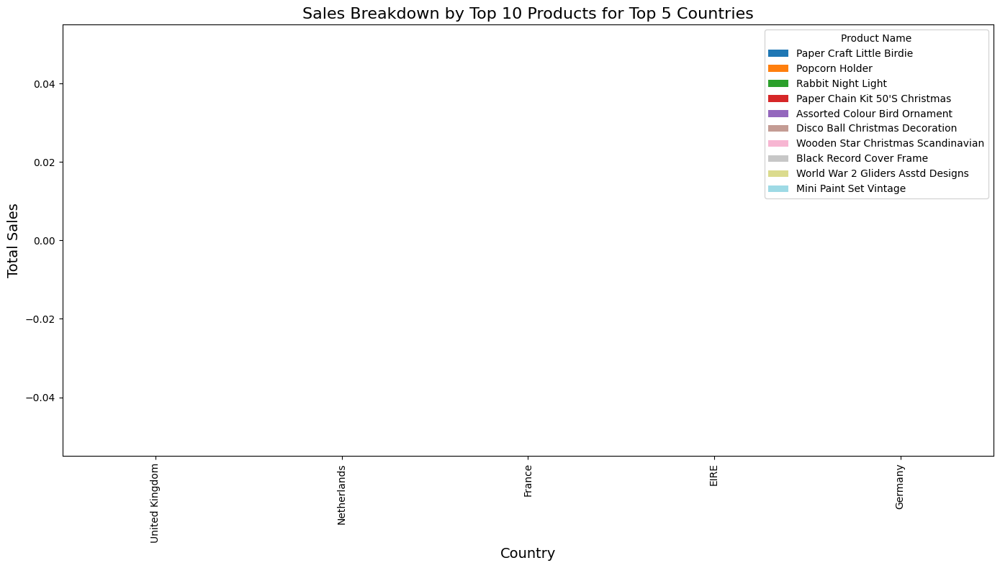

In [25]:
df['TotalSales'] = df['Price'] * df['Quantity']  # Calculate total sales per transaction

# Aggregate sales by country and product
df_country_product_sales = df.groupby(['Country', 'ProductName']).agg(TotalSales=('TotalSales', 'sum')).unstack().fillna(0)

# Get the top 5 countries by total sales
top_countries = df.groupby('Country')['TotalSales'].sum().nlargest(5).index
df_top_country_product_sales = df_country_product_sales.loc[top_countries]

# Get the top 10 products by total sales across all countries
top_products = df.groupby('ProductName')['TotalSales'].sum().nlargest(10).index

# Filter to include only the top products, reindex to handle missing products
df_top_country_product_sales = df_top_country_product_sales.reindex(columns=top_products, fill_value=0)

# Plotting the stacked bar plot for top countries and top products
df_top_country_product_sales.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='tab20')
plt.title('Sales Breakdown by Top 10 Products for Top 5 Countries', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.legend(title='Product Name', bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show plot
plt.show()